#  Step 1: Load and Inspect Mendeley Dataset

In this step, we will:
1. Define the path to the dataset (where all `.csv` files are stored).  
2. Collect all CSV files inside the folder.  
3. Print the number of files found.  
4. Load the first CSV file to **inspect its structure** (columns and first few rows).


In [11]:
import pandas as pd
import glob

# Path to the raw csvs
mendeley_path = r"C:\Users\Honey\OneDrive\Desktop\bsp_publication\raw_data\datasets\Hemoglobin Photoplethysmography Dataset\Raw dataset per subject\Raw dataset per subject"

# Collect all CSVs
csv_files = glob.glob(mendeley_path + "/*.csv")
print(" Total CSVs found:", len(csv_files))

# Load just the first one to inspect
if csv_files:
    df = pd.read_csv(csv_files[0])
    print(" Example file:", csv_files[0])
    print(" Columns:", df.columns.tolist())
    print(df.head())
else:
    print(" No CSVs found at given path")


 Total CSVs found: 68
 Example file: C:\Users\Honey\OneDrive\Desktop\bsp_publication\raw_data\datasets\Hemoglobin Photoplethysmography Dataset\Raw dataset per subject\Raw dataset per subject\1.csv
 Columns: ['Red (a.u)', 'Infra Red (a.u)', 'Gender', 'Age', 'Hemoglobin (g/dL)']
   Red (a.u)  Infra Red (a.u) Gender  Age  Hemoglobin (g/dL)
0     116394           105863   Male   21               17.5
1     116496           105901   Male   21               17.5
2     116534           105945   Male   21               17.5
3     116440           105795   Male   21               17.5
4     115964           105612   Male   21               17.5


In [12]:
from gettext import install

import wfdb

# Install wfdb using Jupyter magic command
%pip install wfdb


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: C:\Users\Honey\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


# Step 2: Load and Inspect BIDMC Dataset

The **BIDMC PPG and Respiration dataset** is stored in **WFDB format**  
(`.hea`, `.dat`, `.mat` files).  

In this step, we will:
1. Locate all `.hea` header files (each subject has one).  
2. Load the records using the `wfdb` library.  
3. Extract:
   - Raw signals (`p_signal`)  
   - Sampling frequency (`fs`)  
   - Channel names (`sig_name`)  
4. Store everything in a dictionary for easy access later.


In [13]:
import wfdb
import os

bidmc_path = r"C:\Users\Honey\OneDrive\Desktop\bsp_publication\raw_data\datasets\bidmc-ppg-and-respiration-dataset-1.0.0"

hea_files = [f for f in os.listdir(bidmc_path) if f.endswith(".hea") and "n" not in f]
print("Total subjects (WFDB):", len(hea_files))

bidmc_raw = {}

for hea in hea_files:
    subj_id = hea.replace(".hea", "")
    record = wfdb.rdrecord(os.path.join(bidmc_path, subj_id))
    bidmc_raw[subj_id] = {
        "signals": record.p_signal,     # numpy array
        "fs": record.fs,                # sampling frequency
        "channels": record.sig_name     # ['II', 'V', 'RESP', 'PLETH']
    }
    print(f"Loaded {subj_id}: {record.p_signal.shape}, channels={record.sig_name}")


Total subjects (WFDB): 53
Loaded bidmc01: (60001, 5), channels=['RESP,', 'PLETH,', 'V,', 'AVR,', 'II,']
Loaded bidmc02: (60001, 5), channels=['II,', 'PLETH,', 'RESP,', 'V,', 'AVR,']
Loaded bidmc03: (60001, 6), channels=['RESP,', 'PLETH,', 'II,', 'V,', 'AVR,', 'CVP,']
Loaded bidmc04: (60001, 6), channels=['RESP,', 'PLETH,', 'II,', 'V,', 'AVR,', 'ABP,']
Loaded bidmc05: (60001, 5), channels=['RESP,', 'PLETH,', 'II,', 'V,', 'AVR,']
Loaded bidmc06: (60001, 7), channels=['RESP,', 'ABP,', 'CVP,', 'PLETH,', 'II,', 'V,', 'AVR,']
Loaded bidmc07: (60001, 7), channels=['RESP,', 'PLETH,', 'II,', 'V,', 'AVR,', 'CVP,', 'ART,']
Loaded bidmc08: (60001, 7), channels=['RESP,', 'PLETH,', 'II,', 'V,', 'AVR,', 'ART,', 'CVP,']
Loaded bidmc09: (60001, 6), channels=['RESP,', 'PLETH,', 'I,', 'V,', 'II,', 'ABP,']
Loaded bidmc10: (60001, 6), channels=['RESP,', 'PLETH,', 'II,', 'V,', 'AVR,', 'CVP,']
Loaded bidmc11: (60001, 5), channels=['PLETH,', 'RESP,', 'II,', 'V,', 'AVR,']
Loaded bidmc12: (60001, 5), channels=[

# Step 3: Visualize PPG Signals (BIDMC)

Now that we have loaded all the raw signals, we want to **visualize the PPG waveforms**.  
This helps verify:
- Which channel corresponds to the PPG signal (`PLETH`).  
- Whether the signals are clean, noisy, or need preprocessing.  

We will create a function to plot the **full-length PPG signal** for each subject.


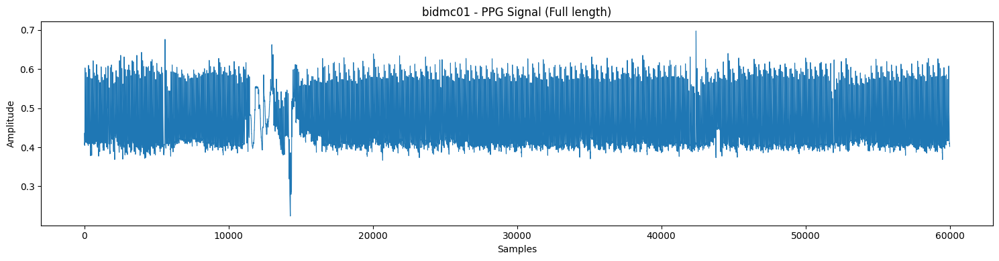

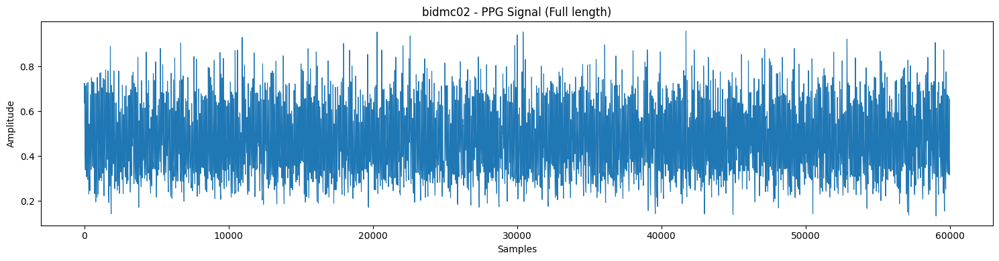

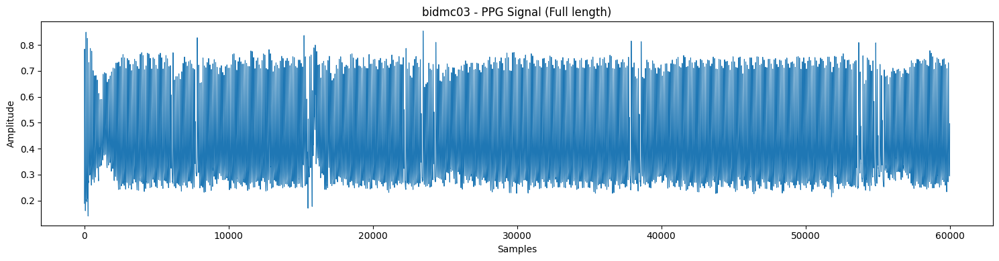

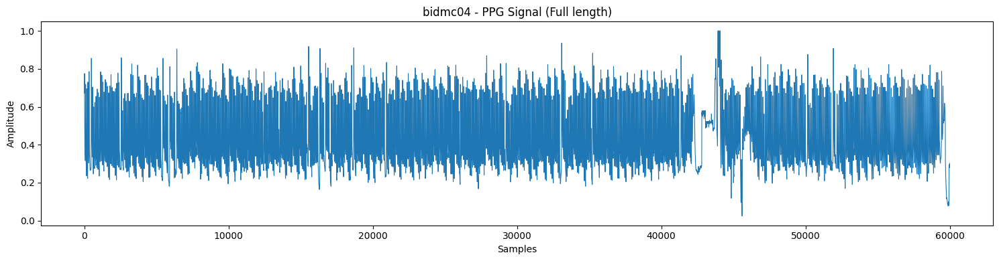

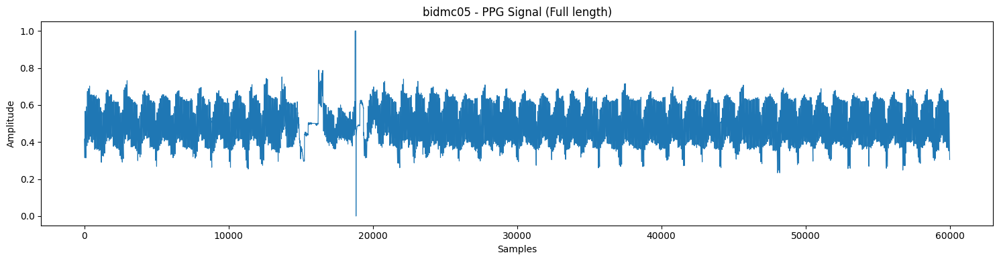

...

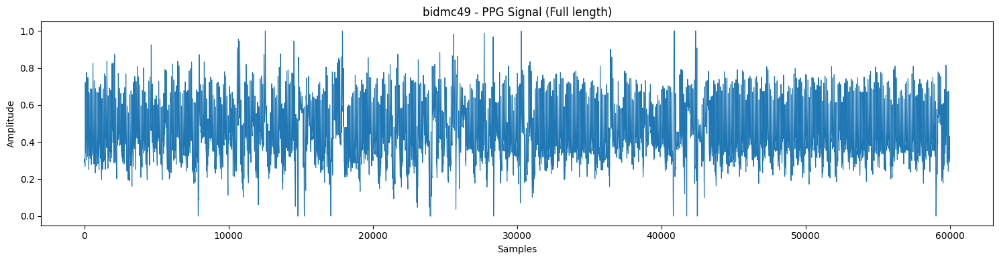

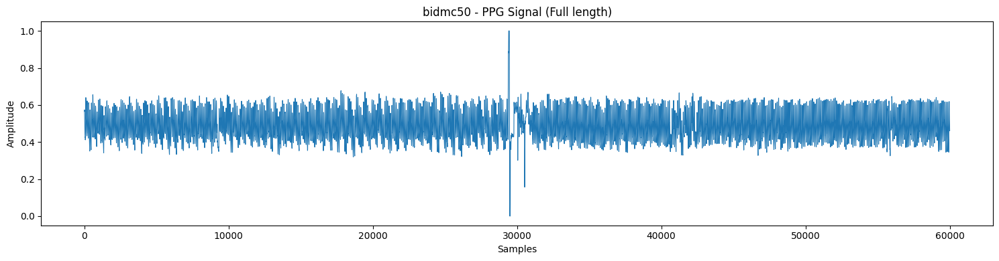

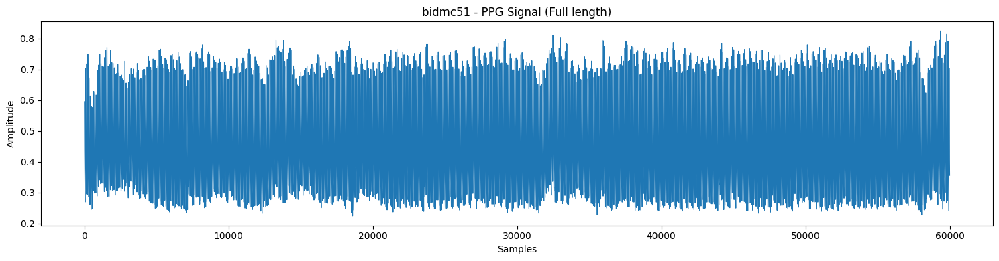

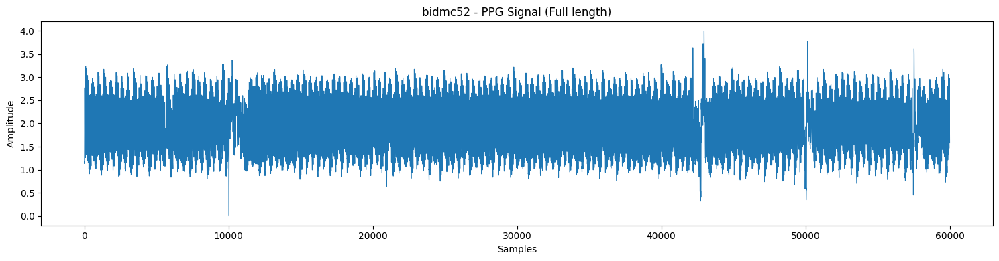

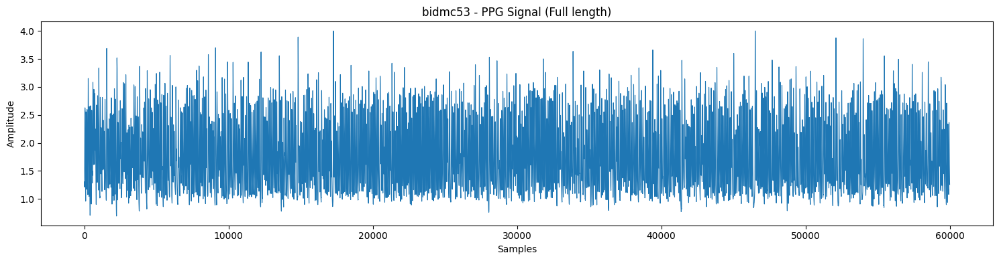

In [14]:
import matplotlib.pyplot as plt

def plot_ppg_all_subjects(bidmc_raw):
    for subj, data in bidmc_raw.items():
        signals = data["signals"]
        channels = data["channels"]
        fs = data["fs"]

        # Find PPG/PLETH channel index
        ppg_idx = [i for i, ch in enumerate(channels) if "PLETH" in ch]
        if not ppg_idx:   # skip if no PLETH
            continue
        ppg_idx = ppg_idx[0]

        ppg = signals[:, ppg_idx]
        t = range(len(ppg))

        # Plot full signal
        plt.figure(figsize=(15,4))
        plt.plot(t, ppg, linewidth=0.8)
        plt.title(f"{subj} - PPG Signal (Full length)")
        plt.xlabel("Samples")
        plt.ylabel("Amplitude")
        plt.tight_layout()
        plt.show()

# Run
plot_ppg_all_subjects(bidmc_raw)


##  BIDMC PPG Analysis (Peaks & Troughs)

### Steps:
1. Load BIDMC dataset (`wfdb.rdrecord`).
2. Extract **PPG channel (PLETH)**.
3. Take **first 10s snippet** for analysis.
4. Detect:
   - **Systolic Peaks (Maxima)** → heartbeat upstrokes.
   - **Diastolic Troughs (Minima)** → valleys between beats.
5. Print details (channels, fs, duration, counts).
6. Plot signals with peaks/troughs (only 5 subjects for clarity).


Total subjects (WFDB): 53

Subject: bidmc01
Channels: ['RESP', 'PLETH', 'V', 'AVR', 'II']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 15 | Diastolic Troughs: 14


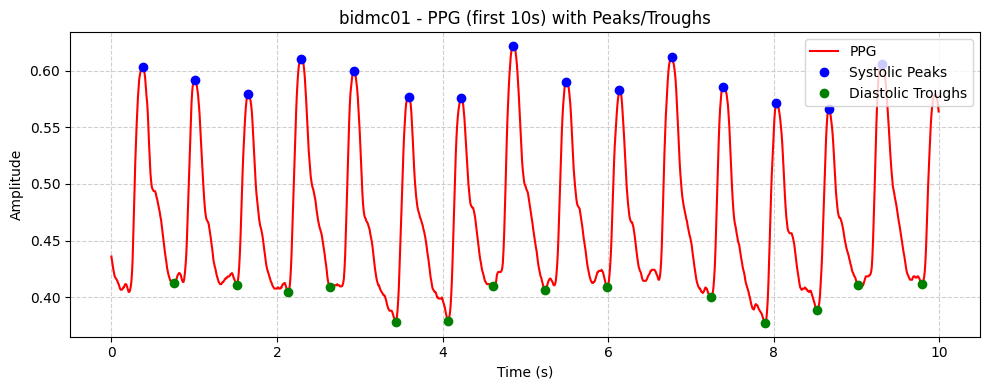


Subject: bidmc02
Channels: ['II', 'PLETH', 'RESP', 'V', 'AVR']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 15 | Diastolic Troughs: 15


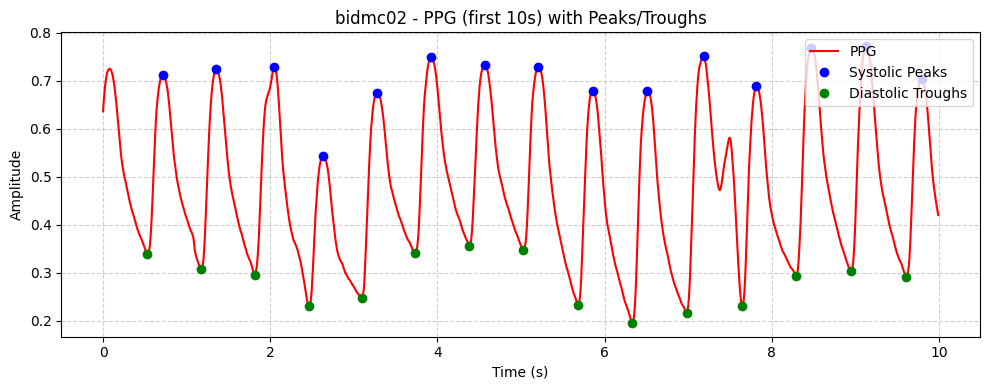


Subject: bidmc03
Channels: ['RESP', 'PLETH', 'II', 'V', 'AVR', 'CVP']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 13 | Diastolic Troughs: 12


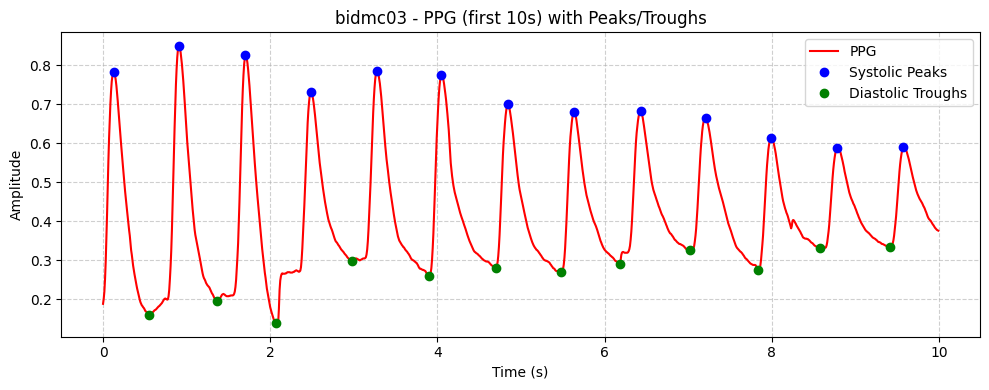


Subject: bidmc04
Channels: ['RESP', 'PLETH', 'II', 'V', 'AVR', 'ABP']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 15 | Diastolic Troughs: 14


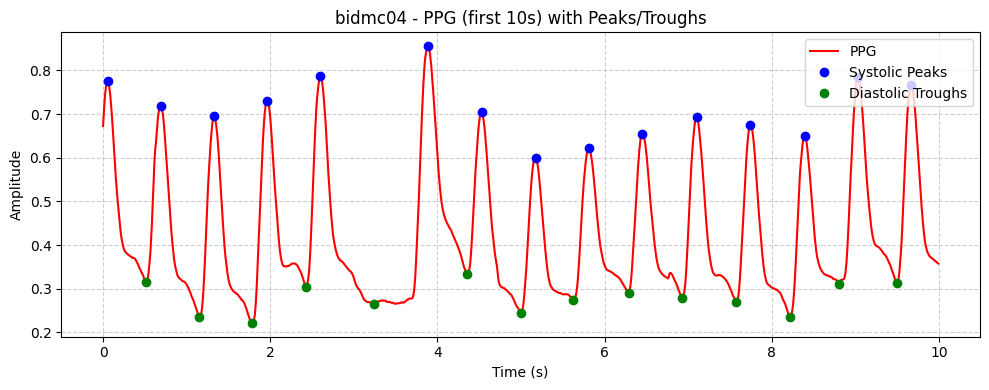


Subject: bidmc05
Channels: ['RESP', 'PLETH', 'II', 'V', 'AVR']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 16 | Diastolic Troughs: 16


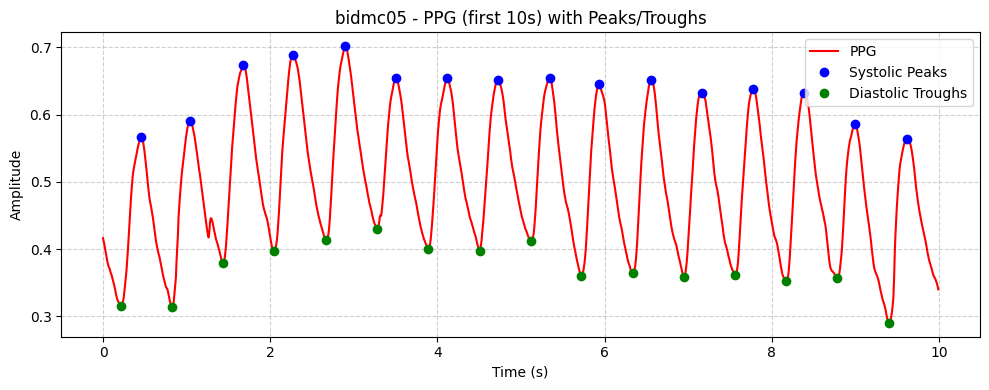


Subject: bidmc06
Channels: ['RESP', 'ABP', 'CVP', 'PLETH', 'II', 'V', 'AVR']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 14 | Diastolic Troughs: 13

Subject: bidmc07
Channels: ['RESP', 'PLETH', 'II', 'V', 'AVR', 'CVP', 'ART']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 15 | Diastolic Troughs: 14

Subject: bidmc08
Channels: ['RESP', 'PLETH', 'II', 'V', 'AVR', 'ART', 'CVP']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 15 | Diastolic Troughs: 16

Subject: bidmc09
Channels: ['RESP', 'PLETH', 'I', 'V', 'II', 'ABP']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 13 | Diastolic Troughs: 12

Subject: bidmc10
Channels: ['RESP', 'PLETH', 'II', 'V', 'AVR', 'CVP']
Sampling Frequency: 125 Hz
PPG Duration: 480.01 sec
Detected Systolic Peaks: 12 | Diastolic Troughs: 12

Subject: bidmc11
Channels: ['PLETH', 'RESP', 'II', 'V', 'AVR']
Sampling Frequency: 125 Hz
PPG Duration: 4

In [10]:
import wfdb
import os
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks

bidmc_path = r"C:\Users\Honey\OneDrive\Desktop\bsp_publication\raw_data\datasets\bidmc-ppg-and-respiration-dataset-1.0.0"

hea_files = [f for f in os.listdir(bidmc_path) if f.endswith(".hea") and "n" not in f]
print("Total subjects (WFDB):", len(hea_files))

bidmc_raw = {}
plot_count = 0

for hea in hea_files:
    subj_id = hea.replace(".hea", "")
    record = wfdb.rdrecord(os.path.join(bidmc_path, subj_id))

    # Clean channel names
    channels = [ch.strip(", ") for ch in record.sig_name]

    bidmc_raw[subj_id] = {
        "signals": record.p_signal,
        "fs": record.fs,
        "channels": channels
    }

    # --- Extract PPG (PLETH) channel ---
    if any("PLETH" in ch.upper() for ch in channels):
        ppg_idx = [i for i, ch in enumerate(channels) if "PLETH" in ch.upper()][0]
        ppg_signal = record.p_signal[:, ppg_idx]

        # First 10 seconds
        n_samples = int(record.fs * 10)
        snippet = ppg_signal[:n_samples]
        t = np.arange(n_samples) / record.fs

        # --- Detect systolic peaks (local maxima) ---
        systolic_peaks, _ = find_peaks(snippet, distance=0.5*record.fs, prominence=0.1)

        # --- Detect diastolic points (local minima) ---
        diastolic_troughs, _ = find_peaks(-snippet, distance=0.5*record.fs, prominence=0.1)

        # Print characteristics
        print(f"\nSubject: {subj_id}")
        print(f"Channels: {channels}")
        print(f"Sampling Frequency: {record.fs} Hz")
        print(f"PPG Duration: {len(ppg_signal)/record.fs:.2f} sec")
        print(f"Detected Systolic Peaks: {len(systolic_peaks)} | Diastolic Troughs: {len(diastolic_troughs)}")

        # Plot (first 5 subjects only)
        if plot_count < 5:
            plt.figure(figsize=(10, 4))
            plt.plot(t, snippet, color="red", label="PPG")
            plt.plot(t[systolic_peaks], snippet[systolic_peaks], "bo", label="Systolic Peaks")
            plt.plot(t[diastolic_troughs], snippet[diastolic_troughs], "go", label="Diastolic Troughs")
            plt.title(f"{subj_id} - PPG (first 10s) with Peaks/Troughs")
            plt.xlabel("Time (s)")
            plt.ylabel("Amplitude")
            plt.legend(loc="upper right")
            plt.grid(True, linestyle="--", alpha=0.6)
            plt.tight_layout()
            plt.show()
            plot_count += 1


#  Step 4: Preprocess Mendeley Dataset (Hemoglobin PPG)

This dataset (`Final Dataset Hb PPG.csv`) contains PPG-derived features, demographic details,  
and corresponding hemoglobin levels.  

We need to preprocess it before using it for training/anemia detection.  

###  Preprocessing steps:
1. **Encode Gender** → Convert categorical (`Male`, `Female`) into numeric (`1`, `0`).  
2. **Create Anemia Label** → Based on WHO hemoglobin cut-offs:
   - Male: Hb < 13 → Anemia = 1  
   - Female: Hb < 12 → Anemia = 1  
   - Else → Anemia = 0  
3. **Normalize Red & InfraRed signals** → Standardize (`mean=0, std=1`) to remove scale differences.  
4. **Save preprocessed dataset** → Store for later use in ML models.


In [20]:
import pandas as pd
import glob
from sklearn.preprocessing import StandardScaler

# Load all CSVs from the raw Mendeley dataset
file_path = "C:/Users/Honey/OneDrive/Desktop/bsp_publication/raw_data/datasets/Hemoglobin Photoplethysmography Dataset/Raw dataset per subject/Raw dataset per subject/*.csv"

csv_files = glob.glob(file_path)

if not csv_files:
    raise FileNotFoundError(" No CSV files found. Check your folder path.")

# Read and concatenate all CSV files
df = pd.concat((pd.read_csv(f) for f in csv_files), ignore_index=True)

print("Loaded subjects:", len(csv_files))
print("Combined dataset shape:", df.shape)

# Step 1: Encode Gender
df['Gender'] = df['Gender'].map({'Male': 1, 'Female': 0})

# Step 2: Create Anemia label
def anemia_label(row):
    if row['Gender'] == 1:   # Male
        return 1 if row['Hemoglobin (g/dL)'] < 13 else 0
    else:                    # Female
        return 1 if row['Hemoglobin (g/dL)'] < 12 else 0

df['Anemia'] = df.apply(anemia_label, axis=1)

# Step 3: Normalize ONLY Red & InfraRed
scaler = StandardScaler()
df[['Red (a.u)', 'Infra Red (a.u)']] = scaler.fit_transform(df[['Red (a.u)', 'Infra Red (a.u)']])

print("\nProcessed dataset preview:")
print(df.head())

# Save
df.to_csv("data/Preprocessed_Final_Dataset.csv", index=False)
print("\nSaved → data/Preprocessed_Final_Dataset.csv")


Loaded subjects: 68
Combined dataset shape: (16955, 5)

Processed dataset preview:
   Red (a.u)  Infra Red (a.u)  Gender  Age  Hemoglobin (g/dL)  Anemia
0   1.073855         1.198376       1   21               17.5       0
1   1.081559         1.201133       1   21               17.5       0
2   1.084429         1.204326       1   21               17.5       0
3   1.077330         1.193443       1   21               17.5       0
4   1.041380         1.180166       1   21               17.5       0

Saved → data/Preprocessed_Final_Dataset.csv


#  Step 5: Load & Inspect Preprocessed Dataset

Now that we have preprocessed the Mendeley dataset, let’s load the  
**`Preprocessed_Final_Dataset.csv`** file to confirm everything looks correct.  

###  Steps performed:
1. Load the preprocessed dataset from CSV.  
2. Print dataset shape (#rows, #columns).  
3. Print column names to verify structure.  
4. Show the **entire dataset** (all rows & columns) for inspection.  


In [22]:
import pandas as pd

# The correctly cleaned path
mendeley_file = "data/Preprocessed_Final_Dataset.csv"

# Load dataset
df_full = pd.read_csv(mendeley_file)

# Show shape and columns
print(" Dataset Loaded")
print("Shape:", df_full.shape)
print("Columns:", df_full.columns.tolist())

# Show full dataset
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

print(df_full)


 Dataset Loaded
Shape: (16955, 6)
Columns: ['Red (a.u)', 'Infra Red (a.u)', 'Gender', 'Age', 'Hemoglobin (g/dL)', 'Anemia']
       Red (a.u)  Infra Red (a.u)  Gender  Age  Hemoglobin (g/dL)  Anemia
0       1.073855         1.198376       1   21               17.5       0
1       1.081559         1.201133       1   21               17.5       0
2       1.084429         1.204326       1   21               17.5       0
3       1.077330         1.193443       1   21               17.5       0
4       1.041380         1.180166       1   21               17.5       0
5       1.020233         1.176829       1   21               17.5       0
6       1.019780         1.179151       1   21               17.5       0
7       1.025520         1.181400       1   21               17.5       0
8       1.029069         1.183286       1   21               17.5       0
9       1.031260         1.184012       1   21               17.5       0
10      1.026200         1.181545       1   21               1

#  Step 6: Preprocessing PPG Signals (BIDMC Dataset)

Raw PPG signals from the BIDMC dataset often contain **noise, baseline wander, and artifacts**.  
To make them usable for feature extraction and classification, we preprocess them.  

###  Preprocessing Steps:
1. **Bandpass Filtering**  
   - We use a Butterworth bandpass filter between **0.5–8 Hz**.  
   - Reason:  
     - PPG heart-rate component usually lies within **0.5–4 Hz** (30–240 BPM).  
     - Extended to 8 Hz to preserve higher harmonics while removing low-frequency drift & high-frequency noise.  

2. **Normalization (Z-score scaling)**  
   - Removes subject-specific amplitude variation due to skin tone, finger size, and contact pressure.  

3. **Store Processed Data**  
   - For each subject → keep both **raw PPG** and **preprocessed PPG** in a dictionary.  

4. **Visualization**  
   - Plot **20 seconds** of raw vs filtered+normalized PPG for the first subject.  


In [23]:
import numpy as np
from scipy.signal import butter, filtfilt
import matplotlib.pyplot as plt

# Bandpass filter function
def bandpass_filter(signal, fs, lowcut=0.5, highcut=8, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype="band")
    return filtfilt(b, a, signal)

ppg_data = {}
for subj, data in bidmc_raw.items():
    signals = data["signals"]
    channels = data["channels"]
    fs = data["fs"]

    # Locate PPG channel
    try:
        ppg_idx = [i for i, ch in enumerate(channels) if "PLETH" in ch][0]
    except IndexError:
        continue

    raw_ppg = signals[:, ppg_idx]

    # 1. Bandpass filter
    filtered_ppg = bandpass_filter(raw_ppg, fs)

    # 2. Normalize (Z-score)
    norm_ppg = (filtered_ppg - np.mean(filtered_ppg)) / np.std(filtered_ppg)

    # 3. Store results
    ppg_data[subj] = {
        "raw": raw_ppg,
        "proc": norm_ppg,
        "fs": fs
    }

print(" Preprocessing done for all BIDMC subjects")


 Preprocessing done for all BIDMC subjects


visualization of raw vs preprocessed

# Plotting Grid of PPG Signals (Raw vs Processed)

This function visualizes **Raw vs Preprocessed PPG signals** for all subjects in a dataset, arranged in a grid layout.

---

##  Parameters

- **`ppg_data`** → dictionary of subjects  
  - Each subject contains:
    - `"fs"` → sampling frequency  
    - `"raw"` → raw PPG signal  
    - `"proc"` → processed PPG signal  
- **`seconds`** → number of seconds of data to display (default = 10)  
- **`ncols`** → number of subplot columns (default = 4)  

---

##  What the Code Does

1. Computes number of rows and columns needed for subplots.  
2. Loops through each subject in the dataset.  
3. Extracts the first **N seconds** of raw and processed signals.  
4. Plots **Raw (red)** vs **Processed (blue)** signals for each subject.  
5. Cleans up the plot by hiding ticks and adding titles.  
6. Shows a **legend only once** to avoid repetition.  
7. Displays the final grid of plots with a global title.  

---

##  Expected Output

- A grid of plots with one subplot per subject.  
- Each subplot shows **Raw vs Processed PPG** for the first `seconds` of recording.  
- Clean layout, legend shown once, subject IDs as subplot titles.  


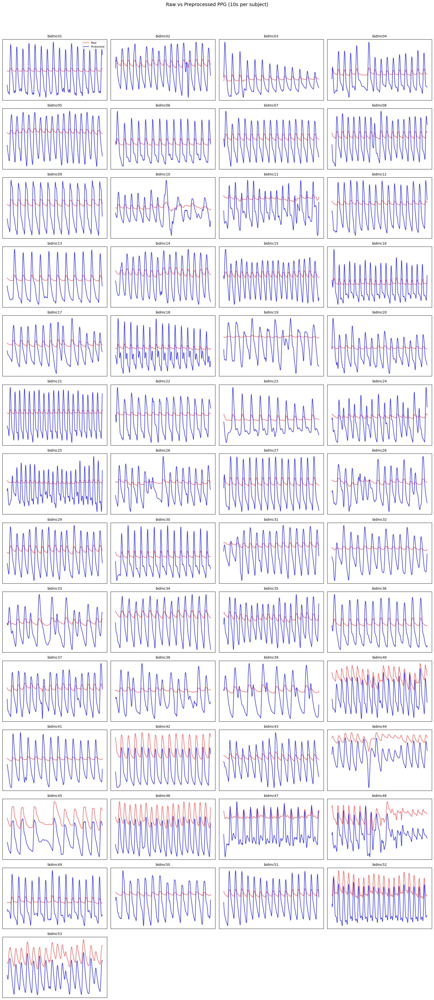

In [24]:
def plot_grid_all_subjects(ppg_data, seconds=10, ncols=4):
    subjects = list(ppg_data.keys())
    nrows = int(np.ceil(len(subjects) / ncols))

    plt.figure(figsize=(18, 3*nrows))

    for i, subj in enumerate(subjects, 1):
        fs = ppg_data[subj]["fs"]
        raw_sig = ppg_data[subj]["raw"][:seconds*fs]
        proc_sig = ppg_data[subj]["proc"][:seconds*fs]
        t = np.arange(len(raw_sig)) / fs

        plt.subplot(nrows, ncols, i)
        plt.plot(t, raw_sig, color="red", alpha=0.6, label="Raw")
        plt.plot(t, proc_sig, color="blue", alpha=0.8, label="Processed")
        plt.title(subj, fontsize=10)
        plt.xticks([]); plt.yticks([])

        if i == 1:
            plt.legend(loc="upper right", fontsize=8)

    plt.suptitle(f"Raw vs Preprocessed PPG ({seconds}s per subject)", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Run grid plot
plot_grid_all_subjects(ppg_data, seconds=10, ncols=4)




#  Peak Detection in Processed PPG Signals

This code performs **peak detection** on the processed PPG (`proc`) signals for all subjects and visualizes the results.

---

##  What the Code Does

1. **Iterates through all subjects** in the `ppg_data` dictionary.  
2. For each subject:
   - Retrieves the processed PPG signal (`proc`) and its sampling frequency (`fs`).  
   - Detects peaks using `scipy.signal.find_peaks`.  
   - Restricts the visualization to **first 10 seconds** for readability.  
   - Plots the signal with detected peaks highlighted.  
3. Displays the number of detected peaks in the plot title.  

---

##  Key Parameters in `find_peaks`

- **`distance=0.3*fs`** → minimum spacing between peaks (0.3 seconds ≈ 200 bpm upper limit).  
- **`prominence=0.2`** → ensures only significant peaks are detected, ignoring small fluctuations or noise.  

---

##  Expected Output

- For each subject, a plot is generated:
  - Blue line → **Processed PPG signal (first 10s)**  
  - Red "x" marks → **Detected peaks**  
  - Title shows the subject ID and total number of detected peaks.  

---



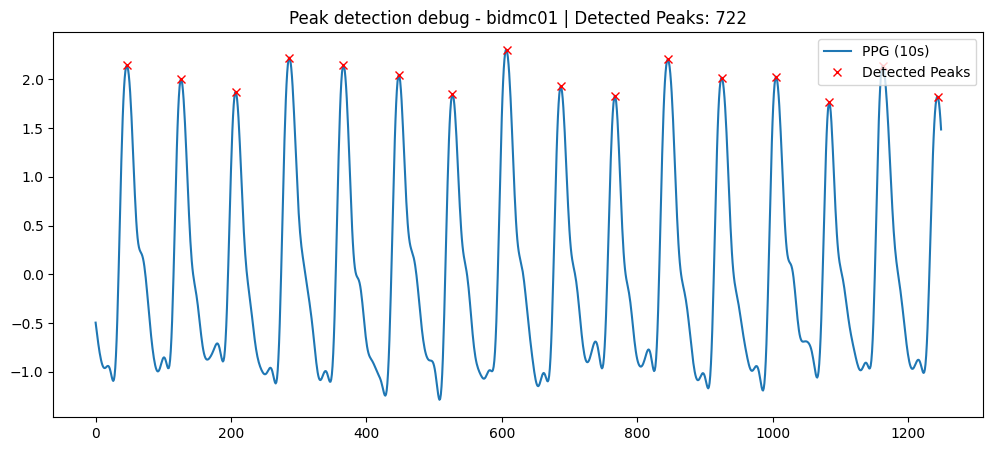

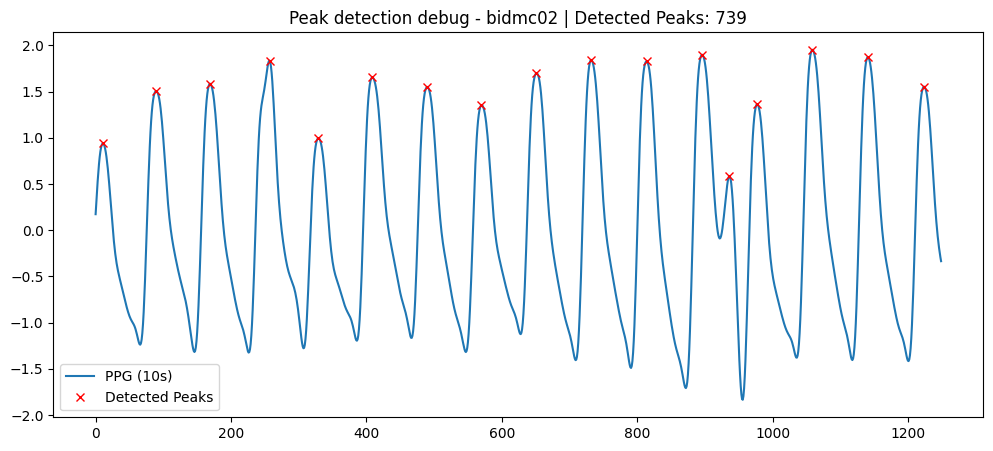

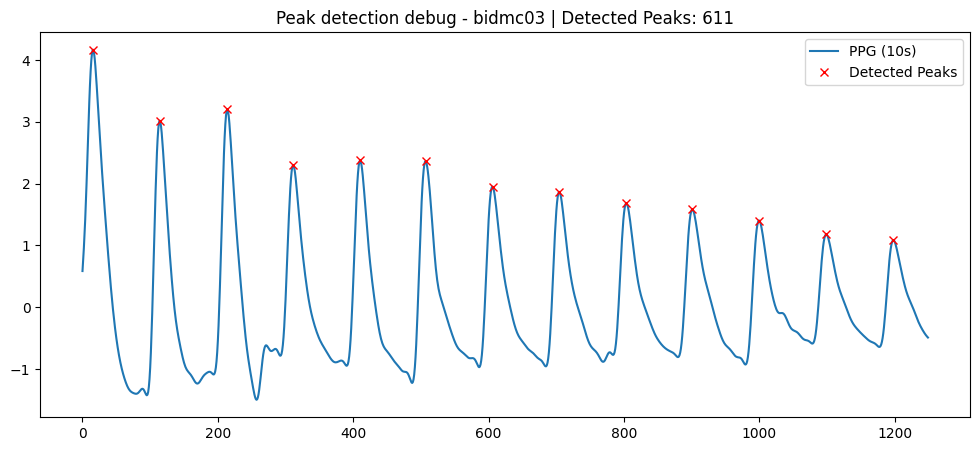

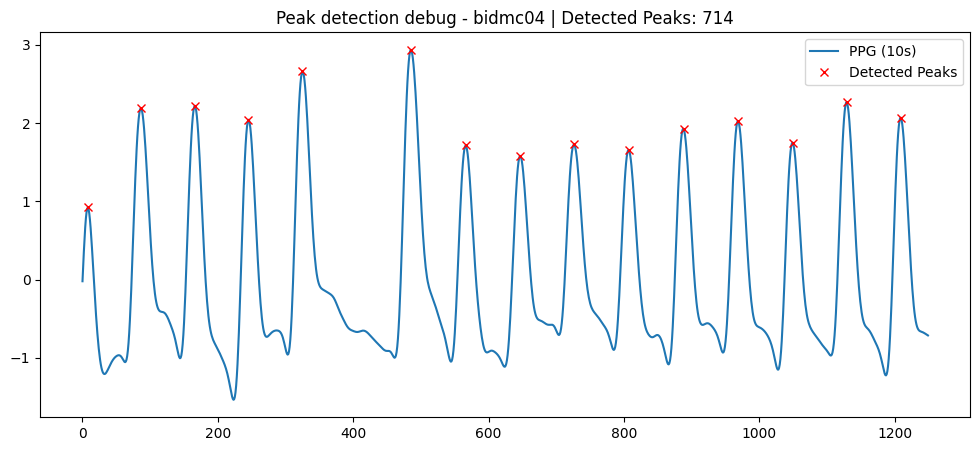

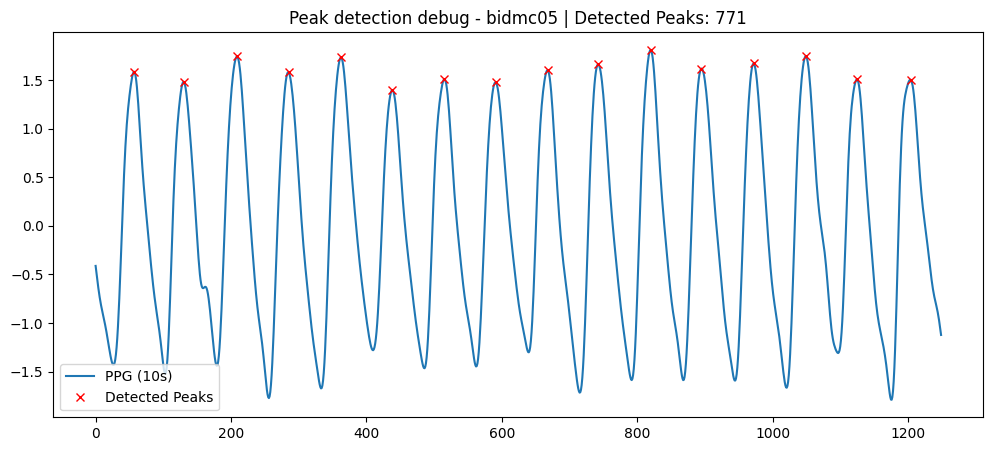

...

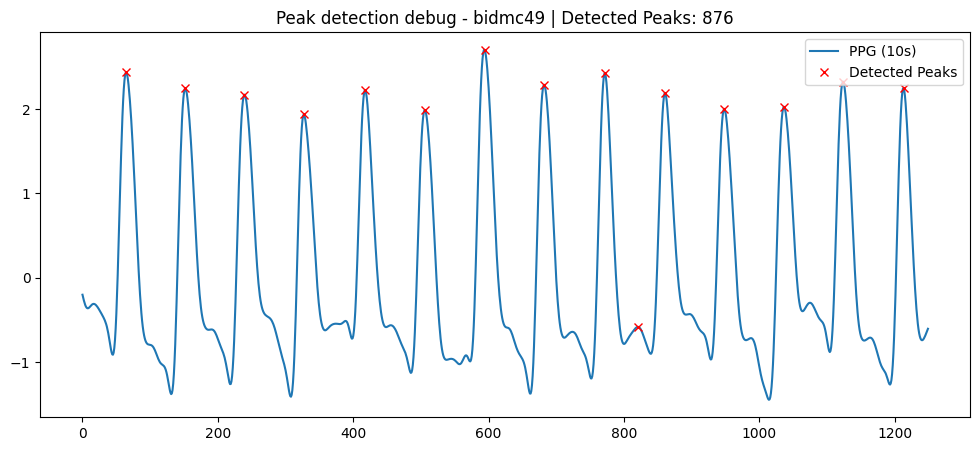

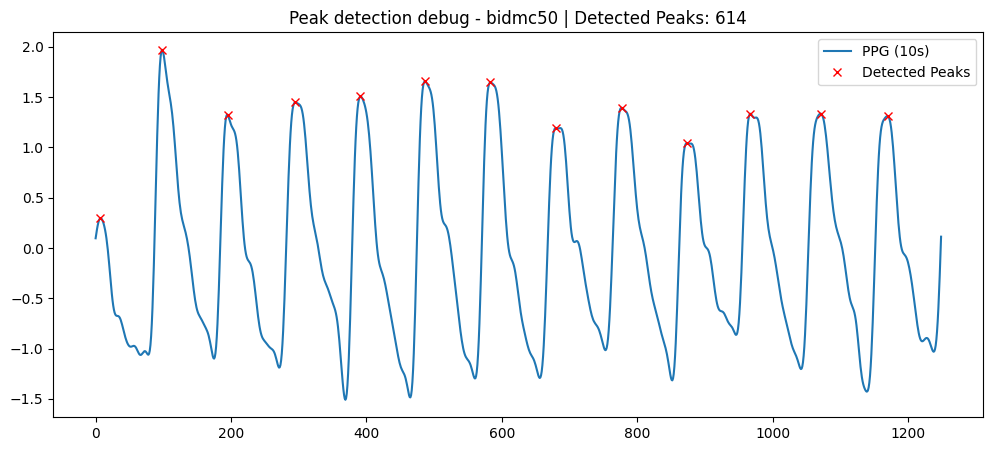

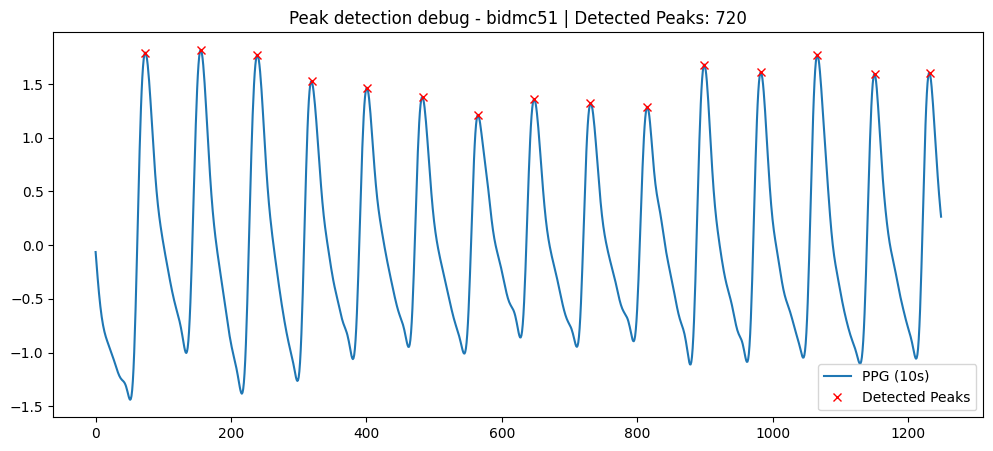

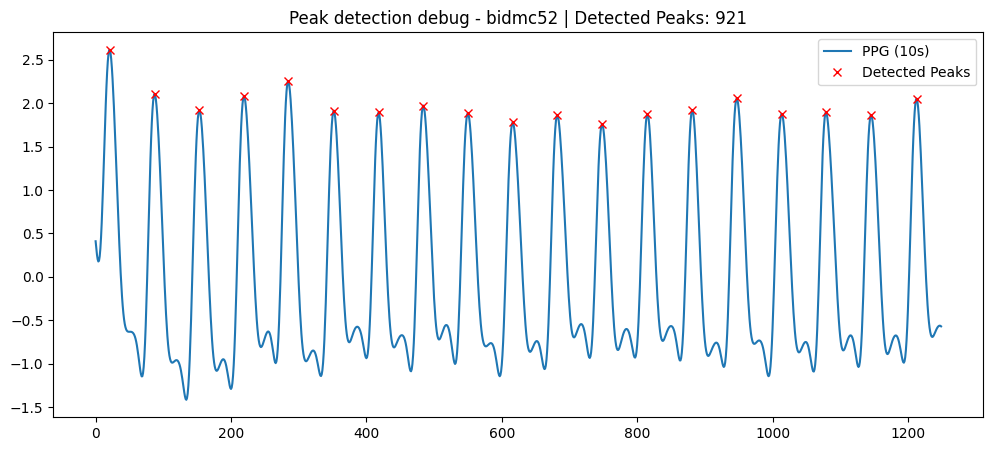

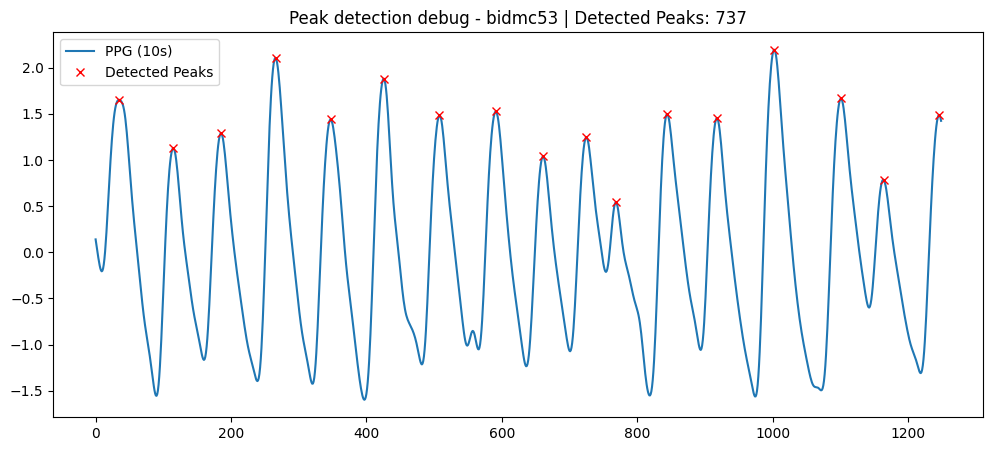

In [25]:
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Loop through ALL subjects and plot 10s with peaks
for subj, data in ppg_data.items():
    proc_ppg = data["proc"]
    fs = data["fs"]

    # Peak detection
    peaks, _ = find_peaks(proc_ppg, distance=0.3*fs, prominence=0.2)

    # Plot only first 10s for readability
    plt.figure(figsize=(12,5))
    plt.plot(proc_ppg[:fs*10], label="PPG (10s)")
    plt.plot(peaks[peaks < fs*10], proc_ppg[peaks[peaks < fs*10]], "rx", label="Detected Peaks")
    plt.legend()
    plt.title(f"Peak detection debug - {subj} | Detected Peaks: {len(peaks)}")
    plt.show()


#  Step 7: Feature Extraction from PPG (BIDMC Dataset)

Once PPG signals are preprocessed, we extract **morphological and temporal features** to represent the cardiovascular activity of each subject.  

###  Feature Extraction Pipeline

1. **Peak Detection**  
   - PPG peaks correspond to **systolic peaks** (heartbeats).  
   - We use `scipy.signal.find_peaks` with a minimum spacing of **0.5s** (≈ HR < 120 bpm).  

2. **Pulse Intervals (RR-intervals)**  
   - Compute the time difference between consecutive peaks.  
   - Equivalent to ECG **RR-intervals**, but from PPG (pulse intervals).  

3. **Extracted Features**
   - **`mean_HR_bpm`** → Average Heart Rate in beats per minute.  
   - **`std_HR`** → Standard deviation of HR (Heart Rate Variability).  
   - **`mean_RR`** → Mean of pulse intervals (s).  
   - **`std_RR`** → Variability of pulse intervals.  
   - **`ppg_amplitude`** → Mean systolic peak amplitude.  
   - **`ppg_amp_var`** → Variability of peak amplitudes.  

4. **Store Features**  
   - For each subject, computed features are saved in a Pandas DataFrame and exported as CSV.  


In [27]:
import numpy as np
import pandas as pd
from scipy.signal import butter, filtfilt, find_peaks

# ---------------------------
# Bandpass filter (0.5–8 Hz)
# ---------------------------
def bandpass_filter(signal, fs, lowcut=0.5, highcut=8, order=4):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype="band")
    return filtfilt(b, a, signal)

# ---------------------------
# 1. Preprocess BIDMC signals
# ---------------------------
ppg_data = {}
for subj, data in bidmc_raw.items():
    signals = data["signals"]
    channels = data["channels"]
    fs = data["fs"]

    # Locate PPG channel
    try:
        ppg_idx = [i for i, ch in enumerate(channels) if "PLETH" in ch.upper()][0]
    except IndexError:
        continue

    raw_ppg = signals[:, ppg_idx]

    # Filter + Normalize
    filtered_ppg = bandpass_filter(raw_ppg, fs)
    norm_ppg = (filtered_ppg - np.mean(filtered_ppg)) / np.std(filtered_ppg)

    ppg_data[subj] = {
        "raw": raw_ppg,
        "proc": norm_ppg,
        "fs": fs
    }

print(f" Preprocessed {len(ppg_data)} BIDMC subjects for feature extraction")

# ---------------------------
# 2. Feature extraction
# ---------------------------
def extract_ppg_features(ppg, fs):
    # --- Detect systolic peaks ---
    peaks, _ = find_peaks(ppg, distance=0.5*fs, prominence=0.3)

    if len(peaks) < 2:
        return None  # not enough peaks to compute intervals

    # --- Compute intervals ---
    peak_times = peaks / fs
    rr_intervals = np.diff(peak_times)

    # --- Features ---
    features = {
        "mean_HR_bpm": 60 / np.mean(rr_intervals),
        "std_HR": np.std(60 / rr_intervals),
        "mean_RR": np.mean(rr_intervals),
        "std_RR": np.std(rr_intervals),
        "ppg_amplitude": np.mean(ppg[peaks]),
        "ppg_amp_var": np.std(ppg[peaks]),
    }
    return features

# ---------------------------
# 3. Run for all subjects
# ---------------------------
bidmc_features = []
for subj, data in ppg_data.items():
    feats = extract_ppg_features(data["proc"], data["fs"])
    if feats is not None:
        feats["subject"] = subj
        bidmc_features.append(feats)

# Convert to DataFrame
df_bidmc_features = pd.DataFrame(bidmc_features)
print(" Extracted features for BIDMC subjects:", df_bidmc_features.shape)
print(df_bidmc_features.head())

# ---------------------------
# Save to csv
# ---------------------------
df_bidmc_features.to_csv("data/Preprocessed_BIDMC_PPG_Features.csv", index=False)
print(" Features saved to data/Preprocessed_BIDMC_PPG_Features.csv")


 Preprocessed 53 BIDMC subjects for feature extraction
 Extracted features for BIDMC subjects: (53, 7)
   mean_HR_bpm    std_HR   mean_RR    std_RR  ppg_amplitude  ppg_amp_var  \
0    89.792613  6.072861  0.668206  0.101506       2.025223     0.332835   
1    90.767202  4.719547  0.661032  0.041401       1.556735     0.468199   
2    75.507137  5.577982  0.794627  0.082465       2.024502     0.235819   
3    88.445757  9.889454  0.678382  0.167986       1.983707     0.384966   
4    95.786240  7.295898  0.626395  0.171376       1.480158     0.278665   

   subject  
0  bidmc01  
1  bidmc02  
2  bidmc03  
3  bidmc04  
4  bidmc05  
 Features saved to data/Preprocessed_BIDMC_PPG_Features.csv


#  Assigning Subject IDs in a PPG Dataset

This code loads a **preprocessed PPG dataset** and assigns **Subject IDs** based on the row structure.

---

##  What the Code Does

1. **Load the dataset**
   - Reads a CSV file containing preprocessed PPG data.  
   - File path:  
     ```
     datasets\Hemoglobin Photoplethysmography Dataset\Preprocessed_Final_Dataset.csv
     ```

2. **Define rows per subject**
   - Each subject has **12 rows** of data.  
   - This information is used to group rows into subjects.  

3. **Create a `SubjectID` column**
   - Formula:  
     ```python
     df['SubjectID'] = (df.index // rows_per_subject) + 1
     ```
   - Explanation:
     - `df.index // rows_per_subject` → integer division assigns the same group number for every 12 rows.  
     - `+1` → makes Subject IDs start from 1 instead of 0.  

4. **Inspect the dataset**
   - Prints the first 15 rows to confirm correct assignment of subject IDs.  

---

## Expected Output

- A DataFrame with a new column `SubjectID`.  
- The first 12 rows will have `SubjectID = 1`, the next 12 rows `SubjectID = 2`, and so on.  

---



In [28]:
import pandas as pd

# Load dataset 
df = pd.read_csv("data/Preprocessed_Final_Dataset.csv")

# Number of rows per subject
rows_per_subject = 12

# Create a subject ID column
df['SubjectID'] = (df.index // rows_per_subject) + 1

print(df.head(15))


    Red (a.u)  Infra Red (a.u)  Gender  Age  Hemoglobin (g/dL)  Anemia  \
0    1.073855         1.198376       1   21               17.5       0   
1    1.081559         1.201133       1   21               17.5       0   
2    1.084429         1.204326       1   21               17.5       0   
3    1.077330         1.193443       1   21               17.5       0   
4    1.041380         1.180166       1   21               17.5       0   
5    1.020233         1.176829       1   21               17.5       0   
6    1.019780         1.179151       1   21               17.5       0   
7    1.025520         1.181400       1   21               17.5       0   
8    1.029069         1.183286       1   21               17.5       0   
9    1.031260         1.184012       1   21               17.5       0   
10   1.026200         1.181545       1   21               17.5       0   
11   1.020233         1.179731       1   21               17.5       0   
12   1.019176         1.180674       1

#  Saving Updated Dataset with Subject IDs

After assigning `SubjectID` to each row, we save the updated DataFrame into a **new CSV file** for later use.

---

##  What the Code Does

1. **Save DataFrame**


In [29]:
# Save the updated DataFrame to a new CSV file
df.to_csv("data/Preprocessed_Final_Dataset_with_SubjectID.csv", index=False)


# **Manual Feature Extraction from PPG Red Channel**

## **Objective**

From the raw **red-channel PPG signal** of each subject, we manually calculate:

1. **PPG Mean Amplitude** – Represents the average intensity of the red signal (approximate pulse amplitude).  
2. **PPG Amplitude Variance** – Represents the variability of the pulse amplitude over time.

These features are combined with **Hemoglobin and Anemia labels** to create a dataset ready for machine learning.



In [30]:
import pandas as pd

# -----------------------------
# Load Mendeley dataset
# -----------------------------
df = pd.read_csv("data/Preprocessed_Final_Dataset_with_SubjectID.csv")

# Prepare feature extraction per subject manually
features_list = []

for subj in df['SubjectID'].unique():
    sub_df = df[df['SubjectID'] == subj]

    # Step 1: Take the Red channel
    signal = sub_df['Red (a.u)'].tolist()  
    
    # Step 2: Compute mean amplitude manually
    total = 0
    for val in signal:
        total += val
    ppg_amplitude = total / len(signal) 

    # Step 3: Compute amplitude variance manually
    squared_diffs = []
    for val in signal:
        diff = val - ppg_amplitude
        squared_diffs.append(diff ** 2)

    ppg_amp_var = sum(squared_diffs) / len(signal)

    # Step 4: HR/RR unavailable → set as NaN
    mean_HR_bpm = float('nan')
    std_HR = float('nan')
    mean_RR = float('nan')
    std_RR = float('nan')

    # Step 5: Use Hemoglobin / Anemia labels
    hemoglobin = sub_df['Hemoglobin (g/dL)'].iloc[0]
    anemia = sub_df['Anemia'].iloc[0]

    # Step 6: Append to feature list
    features_list.append({
        'mean_HR_bpm': mean_HR_bpm,
        'std_HR': std_HR,
        'mean_RR': mean_RR,
        'std_RR': std_RR,
        'ppg_amplitude': ppg_amplitude,
        'ppg_amp_var': ppg_amp_var,
        'hemoglobin': hemoglobin,
        'anemia': anemia,
        'subject': f'mendeley{subj:02d}'
    })

# -----------------------------
# Step 7: Convert to DataFrame & save
# -----------------------------
features_df = pd.DataFrame(features_list)

# Save CSV for training/testing 
features_df.to_csv("data/Mendeley_Features_Manual.csv", index=False)

print("Manual Mendeley features with labels saved successfully!")
print(features_df.head())


Manual Mendeley features with labels saved successfully!
   mean_HR_bpm  std_HR  mean_RR  std_RR  ppg_amplitude  ppg_amp_var  \
0          NaN     NaN      NaN     NaN       1.044237     0.000651   
1          NaN     NaN      NaN     NaN       1.048209     0.000355   
2          NaN     NaN      NaN     NaN       1.016835     0.000097   
3          NaN     NaN      NaN     NaN       1.041009     0.000587   
4          NaN     NaN      NaN     NaN       1.012511     0.000135   

   hemoglobin  anemia     subject  
0        17.5       0  mendeley01  
1        17.5       0  mendeley02  
2        17.5       0  mendeley03  
3        17.5       0  mendeley04  
4        17.5       0  mendeley05  


#  Anemia Prediction  Using PPG Features and Random Forest


1. Loading and preprocessing datasets (Mendeley and BIDMC).  
2. Extracting features from PPG signals (amplitude, variance, optional HR/RR).  
3. Scaling features.  
4. Training a Random Forest classifier.  
5. Predicting anemia on BIDMC dataset.  
6. Saving results and optional evaluation.


Loaded:
 - Mendeley: (1413, 9)
 - BIDMC: (53, 7)

Random Forest Training Completed.


Saved model and scaler:
 - models/final_model_mendeley.pkl
 - models/final_scaler_mendeley.pkl



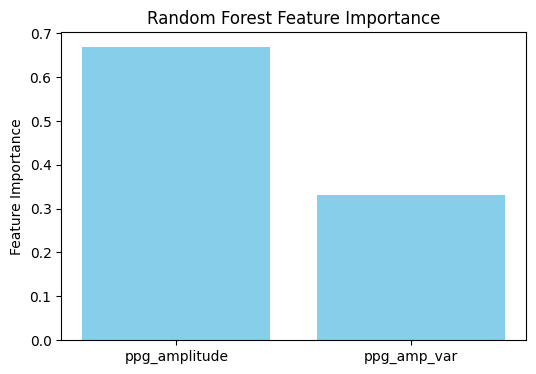

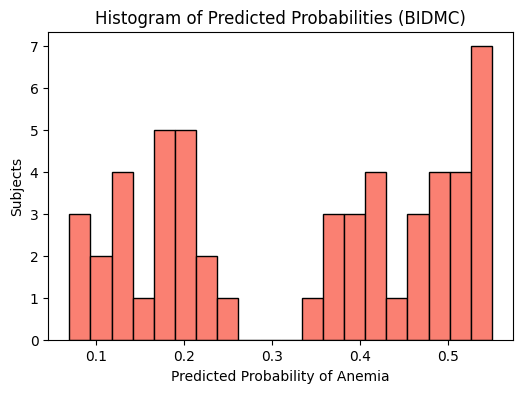

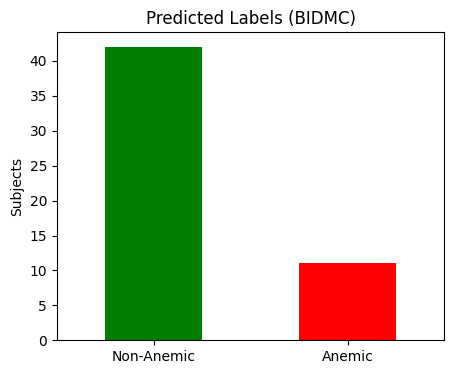


Prediction Summary:
Non-Anemic: 42
Anemic: 11

Predictions saved → data/BIDMC_Predicted_Anemia.csv

Classification Report (Training set):

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       874
           1       1.00      1.00      1.00       539

    accuracy                           1.00      1413
   macro avg       1.00      1.00      1.00      1413
weighted avg       1.00      1.00      1.00      1413



C:\Users\Honey\AppData\Local\Temp\ipykernel_33708\2647982556.py:134: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=bidmc_results['subject'], y=bidmc_results['anemia_probability'], palette="coolwarm")


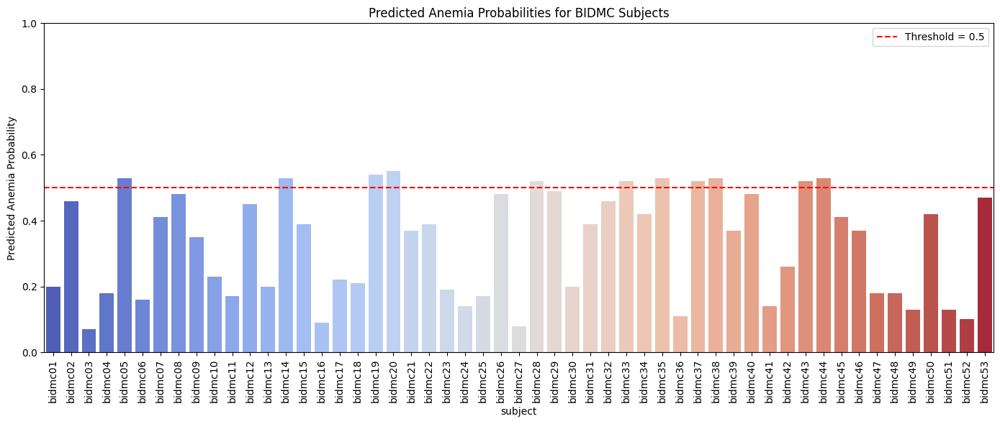

In [34]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# =====================================================
# STEP 1: Load datasets
# =====================================================
mendeley_df = pd.read_csv("data/Mendeley_Features_Manual.csv")
bidmc_df = pd.read_csv("data/Preprocessed_BIDMC_PPG_Features.csv")

print("Loaded:")
print(" - Mendeley:", mendeley_df.shape)
print(" - BIDMC:", bidmc_df.shape)

# =====================================================
# STEP 2: Select features & target
# =====================================================
features = ['ppg_amplitude', 'ppg_amp_var']

# Remove NaN rows from training set
mendeley_df = mendeley_df.dropna(subset=features)

X_train = mendeley_df[features].values
y_train = mendeley_df['anemia'].values

X_bidmc = bidmc_df[features].values
subjects_bidmc = bidmc_df['subject'].values

# =====================================================
# STEP 3: Scale features
# =====================================================
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_bidmc_scaled = scaler.transform(X_bidmc)

# =====================================================
# STEP 4: Train Random Forest
# =====================================================
clf = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    class_weight='balanced'
)
clf.fit(X_train_scaled, y_train)

print("\nRandom Forest Training Completed.\n")

# =====================================================
# STEP 4.5: SAVE MODEL + SCALER
# =====================================================

joblib.dump(clf, "models/final_model_mendeley.pkl")
joblib.dump(scaler, "models/final_scaler_mendeley.pkl")

print("\nSaved model and scaler:")
print(" - models/final_model_mendeley.pkl")
print(" - models/final_scaler_mendeley.pkl\n")

# =====================================================
# STEP 5: Feature Importance
# =====================================================
importances = clf.feature_importances_

plt.figure(figsize=(6,4))
plt.bar(features, importances, color='skyblue')
plt.ylabel('Feature Importance')
plt.title('Random Forest Feature Importance')
plt.show()

# =====================================================
# STEP 6: Predict probabilities for BIDMC
# =====================================================
y_proba_bidmc = clf.predict_proba(X_bidmc_scaled)[:, 1]

threshold = 0.5
y_pred_bidmc = (y_proba_bidmc >= threshold).astype(int)

# =====================================================
# STEP 7: Histogram
# =====================================================
plt.figure(figsize=(6,4))
plt.hist(y_proba_bidmc, bins=20, color='salmon', edgecolor='black')
plt.xlabel('Predicted Probability of Anemia')
plt.ylabel('Subjects')
plt.title('Histogram of Predicted Probabilities (BIDMC)')
plt.show()

# =====================================================
# STEP 8: Label distribution
# =====================================================
plt.figure(figsize=(5,4))
pd.Series(y_pred_bidmc).value_counts().plot(kind='bar', color=['green','red'])
plt.xticks([0,1], ['Non-Anemic','Anemic'], rotation=0)
plt.ylabel('Subjects')
plt.title('Predicted Labels (BIDMC)')
plt.show()

# =====================================================
# STEP 9: Print statistics
# =====================================================
label_counts = pd.Series(y_pred_bidmc).value_counts()
print("\nPrediction Summary:")
print("Non-Anemic:", label_counts.get(0,0))
print("Anemic:", label_counts.get(1,0))

# =====================================================
# STEP 10: Save results CSV
# =====================================================
bidmc_results = pd.DataFrame({
    'subject': subjects_bidmc,
    'predicted_anemia': y_pred_bidmc,
    'anemia_probability': y_proba_bidmc
})

bidmc_results.to_csv("data/BIDMC_Predicted_Anemia.csv", index=False)
print("\nPredictions saved → data/BIDMC_Predicted_Anemia.csv")

# =====================================================
# STEP 11: Training set performance
# =====================================================
y_train_pred = clf.predict(X_train_scaled)
print("\nClassification Report (Training set):\n")
print(classification_report(y_train, y_train_pred))

# =====================================================
# STEP 12: Seaborn barplot visualization
# =====================================================
plt.figure(figsize=(14,6))
sns.barplot(x=bidmc_results['subject'], y=bidmc_results['anemia_probability'], palette="coolwarm")
plt.xticks(rotation=90)
plt.ylabel("Predicted Anemia Probability")
plt.title("Predicted Anemia Probabilities for BIDMC Subjects")
plt.ylim(0, 1)
plt.axhline(0.5, color='red', linestyle='--', label="Threshold = 0.5")
plt.legend()
plt.tight_layout()
plt.show()


## Visualize Predicted Anemia Probabilities for BIDMC Subjects

In [41]:
print(bidmc_results['predicted_anemia'].value_counts())


predicted_anemia
0    42
1    11
Name: count, dtype: int64


In [42]:
importances = clf.feature_importances_
features = ['ppg_amplitude', 'ppg_amp_var']  
for f, imp in zip(features, importances):
    print(f"{f}: {imp:.3f}")


ppg_amplitude: 0.669
ppg_amp_var: 0.331


#  Merge BIDMC Features with Predicted Anemia Labels

This step combines the **BIDMC feature dataset** with the **predicted anemia labels** to create a single dataset for analysis or further modeling.


In [43]:
import pandas as pd

# -----------------------------
# File paths (correct ones)
# -----------------------------
features_path = "data/Preprocessed_BIDMC_PPG_Features.csv"
labels_path   = "data/BIDMC_Predicted_Anemia.csv"
combined_path = "data/BIDMC_Combined_Features_Labels.csv"

# -----------------------------
# Load CSVs
# -----------------------------
features_df = pd.read_csv(features_path)
labels_df   = pd.read_csv(labels_path)

# -----------------------------
# Merge features with labels
# -----------------------------
combined_df = pd.merge(features_df, labels_df, on='subject', how='inner')
print(f"Merged dataset shape: {combined_df.shape}")

# -----------------------------
# Save combined dataset
# -----------------------------
combined_df.to_csv(combined_path, index=False)
print("Combined dataset saved successfully!")


Merged dataset shape: (53, 9)
Combined dataset saved successfully!


#  Train and Evaluate Random Forest on Combined BIDMC Dataset


1. Load the **combined BIDMC dataset** (features + predicted anemia labels)  
2. Split data into **training and test sets**  
3. **Scale features** using Min-Max scaling  
4. Train a **Random Forest classifier**  
5. Evaluate model using **classification report, confusion matrix, feature importance, and correlations**  
6. Visualize **feature distributions**  
7. Save the trained model and scaler for future use  


Combined dataset shape: (53, 9)

Classification Report on Test Set:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         9
           1       1.00      1.00      1.00         2

    accuracy                           1.00        11
   macro avg       1.00      1.00      1.00        11
weighted avg       1.00      1.00      1.00        11



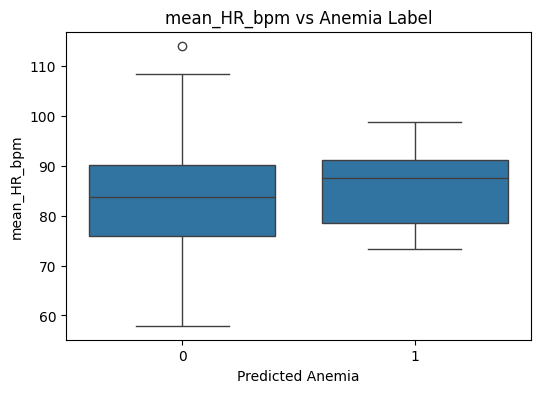

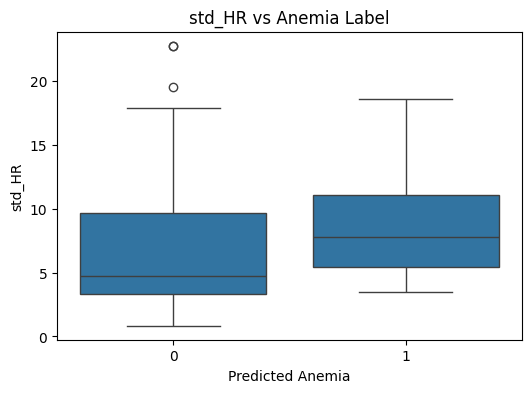

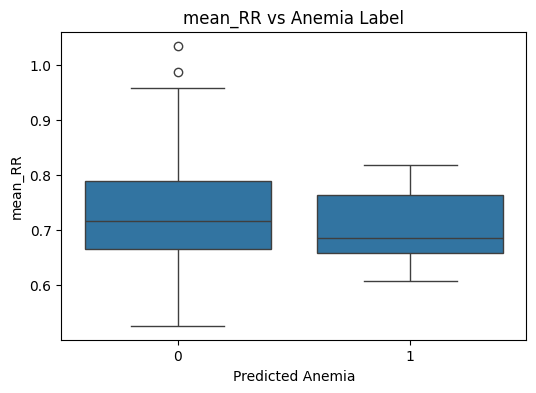

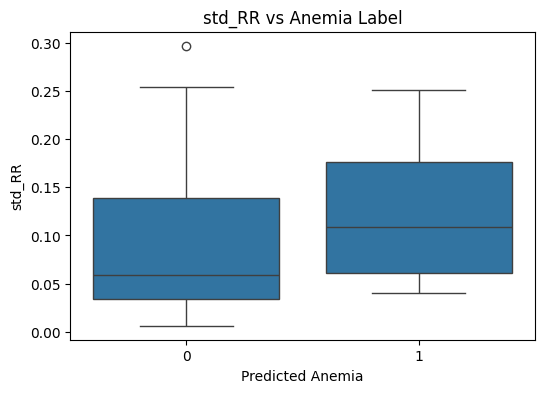

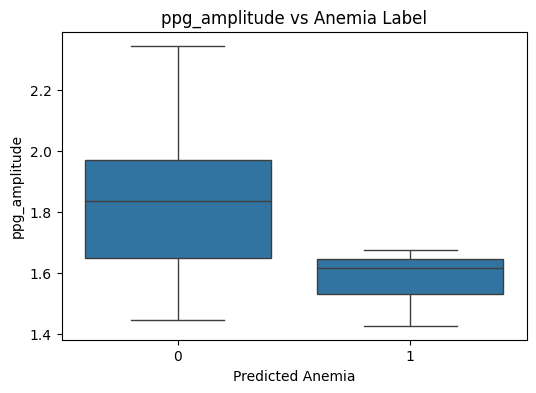

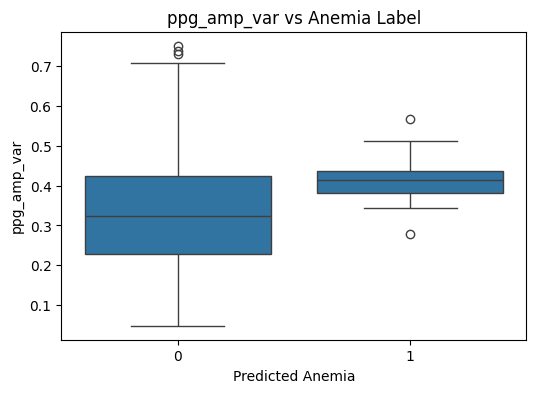

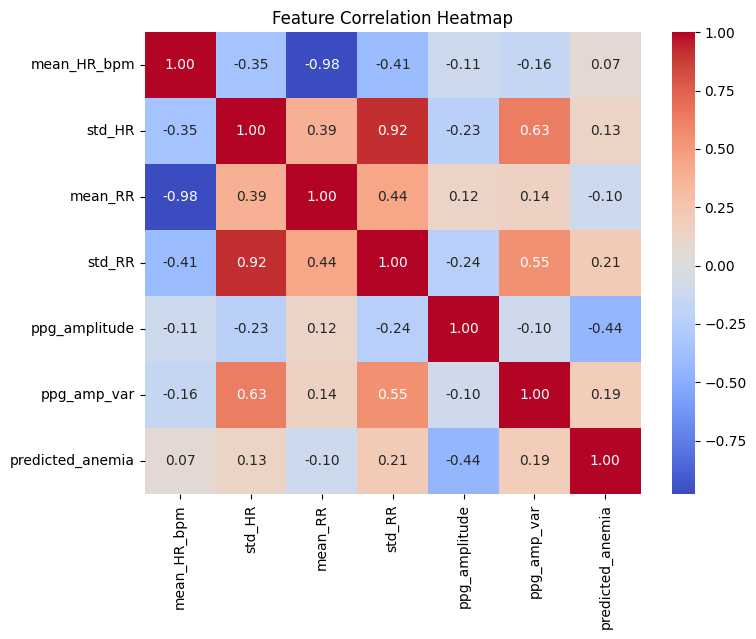

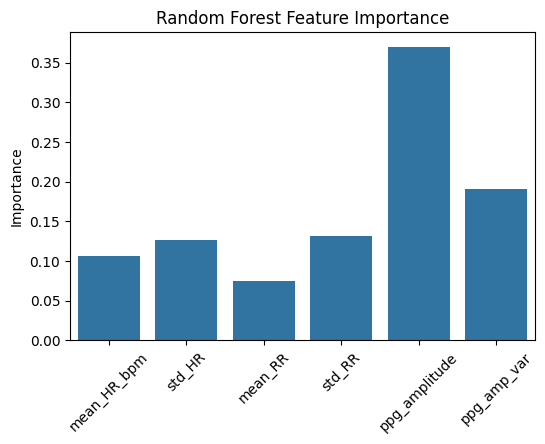

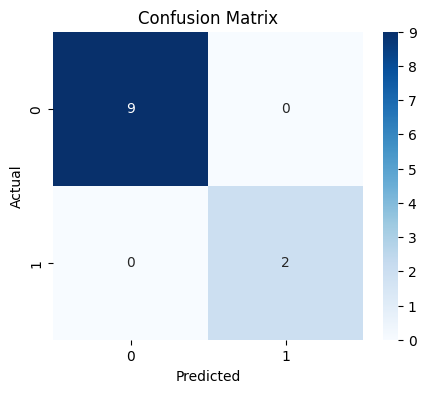

Model and scaler saved successfully in models/ folder!


In [44]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib

# -----------------------------
# File paths (fixed for your project)
# -----------------------------
combined_path = "data/BIDMC_Combined_Features_Labels.csv"
model_path    = "models/anemia2_model_bidmc.pkl"
scaler_path   = "models/anemia2_scaler_bidmc.pkl"

# -----------------------------
# Load combined dataset
# -----------------------------
df = pd.read_csv(combined_path)
print(f"Combined dataset shape: {df.shape}")

# -----------------------------
# Select features & label
# -----------------------------
features = ['mean_HR_bpm','std_HR','mean_RR','std_RR','ppg_amplitude','ppg_amp_var']
df = df.dropna(subset=features)

X = df[features]
y = df['predicted_anemia']

# -----------------------------
# Split into train/test
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# -----------------------------
# Scale features
# -----------------------------
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# -----------------------------
# Train Random Forest classifier
# -----------------------------
clf = RandomForestClassifier(
    n_estimators=200,
    random_state=42,
    class_weight='balanced'
)
clf.fit(X_train_scaled, y_train)

# -----------------------------
# Evaluate model
# -----------------------------
y_pred = clf.predict(X_test_scaled)
print("\nClassification Report on Test Set:\n")
print(classification_report(y_test, y_pred))

# -----------------------------
# 1. Feature distributions by anemia label
# -----------------------------
for feat in features:
    plt.figure(figsize=(6,4))
    sns.boxplot(x=y, y=X[feat])
    plt.title(f'{feat} vs Anemia Label')
    plt.xlabel('Predicted Anemia')
    plt.ylabel(feat)
    plt.show()

# -----------------------------
# 2. Correlation heatmap
# -----------------------------
plt.figure(figsize=(8,6))
corr = df[features + ['predicted_anemia']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Feature Correlation Heatmap")
plt.show()

# -----------------------------
# 3. Random Forest feature importance
# -----------------------------
importances = clf.feature_importances_
plt.figure(figsize=(6,4))
sns.barplot(x=features, y=importances)
plt.title("Random Forest Feature Importance")
plt.ylabel("Importance")
plt.xticks(rotation=45)
plt.show()

# -----------------------------
# 4. Confusion matrix
# -----------------------------
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# -----------------------------
# Save model & scaler (correct folder)
# -----------------------------
joblib.dump(clf, model_path)
joblib.dump(scaler, scaler_path)
print("Model and scaler saved successfully in models/ folder!")
